# Creación de la CNN - Datos

1) Manejo de datos: Comenzamos importando el archivo de datos Datos_Pneumo_5857.pkl

In [ ]:
# Importamos las librerias a usar:
import pandas as pd
import numpy as np
import sys

from tensorflow import keras

from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Dense, Activation, Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from keras.preprocessing.image import array_to_img
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from sklearn.preprocessing import OneHotEncoder
import pydot
from IPython.display import SVG
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import SGD

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import pickle

import time

np.random.seed(1)

%matplotlib inline


In [ ]:
# Leemos el documento
df = pd.read_pickle('/content/drive/MyDrive/Datos_Pneumo_5857.pkl')

In [ ]:
# Visualizamos las columnas
print(df.columns)

# Visualizamos la forma de los datos:
print(df.describe)

Index(['Imagen', 'Estado'], dtype='object')
<bound method NDFrame.describe of                                                  Imagen  Estado
0     [[[18.0, 18.0, 18.0], [16.0, 16.0, 16.0], [16....       0
1     [[[91.0, 91.0, 91.0], [94.0, 94.0, 94.0], [92....       0
2     [[[28.0, 28.0, 28.0], [36.0, 36.0, 36.0], [43....       0
3     [[[5.0, 5.0, 5.0], [5.0, 5.0, 5.0], [4.0, 4.0,...       0
4     [[[62.0, 62.0, 62.0], [66.0, 66.0, 66.0], [74....       0
...                                                 ...     ...
5852  [[[64.0, 64.0, 64.0], [55.0, 55.0, 55.0], [54....       1
5853  [[[37.0, 37.0, 37.0], [39.0, 39.0, 39.0], [38....       1
5854  [[[40.0, 40.0, 40.0], [45.0, 45.0, 45.0], [45....       1
5855  [[[11.0, 11.0, 11.0], [11.0, 11.0, 11.0], [10....       1
5856  [[[12.0, 12.0, 12.0], [6.0, 6.0, 6.0], [4.0, 4...       1

[5857 rows x 2 columns]>


In [ ]:
# Contamos los valores
print( 'Personas sanas: ', df['Estado'].value_counts()[0]  )
print( 'Personas enfermas: ', df['Estado'].value_counts()[1] )

Personas sanas:  1583
Personas enfermas:  4274


Como puede observarse de la columna anterior, los datos se encuentran sesgados. Para realizar una primera aproximación al modelo vamos a tomar la misma cantidad de datos en ambos conjuntos.

Es decir, tomaremos 1583 imagenes de personas sanas y enfermas

In [ ]:
# Tomamos un nuevo DF, NOTA: Los datos estan organizados
df = df[0 : (1583*2)]
print(df.shape)
print(df.describe)

(3166, 2)
<bound method NDFrame.describe of                                                  Imagen  Estado
0     [[[18.0, 18.0, 18.0], [16.0, 16.0, 16.0], [16....       0
1     [[[91.0, 91.0, 91.0], [94.0, 94.0, 94.0], [92....       0
2     [[[28.0, 28.0, 28.0], [36.0, 36.0, 36.0], [43....       0
3     [[[5.0, 5.0, 5.0], [5.0, 5.0, 5.0], [4.0, 4.0,...       0
4     [[[62.0, 62.0, 62.0], [66.0, 66.0, 66.0], [74....       0
...                                                 ...     ...
3161  [[[91.0, 91.0, 91.0], [71.0, 71.0, 71.0], [55....       1
3162  [[[5.0, 5.0, 5.0], [11.0, 11.0, 11.0], [255.0,...       1
3163  [[[26.0, 26.0, 26.0], [44.0, 44.0, 44.0], [48....       1
3164  [[[58.0, 58.0, 58.0], [56.0, 56.0, 56.0], [55....       1
3165  [[[103.0, 103.0, 103.0], [46.0, 46.0, 46.0], [...       1

[3166 rows x 2 columns]>


In [ ]:
print(df.iloc[ 1582, 1] )
print(df.iloc[ 1583, 1] )

0
1


In [ ]:
# Separacion aleatoria:
df = df.sample(frac = 1)

# Muestra de aleatoriedad
print(df.describe)

<bound method NDFrame.describe of                                                  Imagen  Estado
839   [[[25.0, 25.0, 25.0], [28.0, 28.0, 28.0], [33....       0
2793  [[[36.0, 36.0, 36.0], [103.0, 103.0, 103.0], [...       1
1196  [[[27.0, 27.0, 27.0], [31.0, 31.0, 31.0], [33....       0
2360  [[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...       1
2881  [[[23.0, 23.0, 23.0], [25.0, 25.0, 25.0], [30....       1
...                                                 ...     ...
2763  [[[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0,...       1
905   [[[209.0, 209.0, 209.0], [195.0, 195.0, 195.0]...       0
1096  [[[76.0, 76.0, 76.0], [74.0, 74.0, 74.0], [67....       0
235   [[[1.0, 1.0, 1.0], [1.0, 1.0, 1.0], [0.0, 0.0,...       0
1061  [[[111.0, 111.0, 111.0], [111.0, 111.0, 111.0]...       0

[3166 rows x 2 columns]>


Una vez que hemos reorganizado los datos, los separamos en train y test

In [ ]:
test_ratio = 0.1 # Relacion de test
train_ratio = int( (1.0 - test_ratio)*len(df.values[:,:])) # Relacion de train

# Separacion de datos
train = df.iloc[0: train_ratio, :]
test = df.iloc[train_ratio:, :]

# Eliminamos df
del df

# Mostramos la cantidad de datos en cada uno:
print(train.shape)
print(test.shape)

(2849, 2)
(317, 2)


In [ ]:
# Obtenemos train(x,y) - test(x,y)

train_x = (train.iloc[: , 0:1]).values
train_y = (train.iloc[ : , 1:2]).values

del train

test_x = (test.iloc[: , 0:1]).values
test_y = (test.iloc[ :, 1:2]).values

del test


In [ ]:
# Mostramos el tipo y la forma del dato
print('Train_x - Tipo: ', type(train_x), ' Dimension: ', train_x.shape )
print('Train_y - Tipo: ', type(train_y), ' Dimension: ', train_y.shape )
print('Test_x - Tipo: ', type(test_x), ' Dimension: ', test_x.shape )
print('Test_y - Tipo: ', type(test_y), ' Dimension: ', test_y.shape )


Train_x - Tipo:  <class 'numpy.ndarray'>  Dimension:  (2849, 1)
Train_y - Tipo:  <class 'numpy.ndarray'>  Dimension:  (2849, 1)
Test_x - Tipo:  <class 'numpy.ndarray'>  Dimension:  (317, 1)
Test_y - Tipo:  <class 'numpy.ndarray'>  Dimension:  (317, 1)


In [ ]:
# Reajustamos a train_x a (n, 256, 256, 3)
x_train = np.zeros( (np.shape(train_x)[0], 256, 256, 3) )
x_train = np.stack(train_x[:, 0])
y_train = np.stack(train_y[:, 0])
del train_x
del train_y
print(x_train.shape)
print(y_train.shape)

(2849, 256, 256, 3)
(2849,)


In [ ]:
# Reajustramos test_x a (n, 256, 256, 3)
x_test = np.zeros( (np.shape(test_x)[0] ,256, 256, 3) )
x_test = np.stack(test_x[:, 0] )
y_test = np.stack(test_y[:, 0])
del test_x
del test_y
print(x_test.shape )
print(y_test.shape)


(317, 256, 256, 3)
(2849,)


In [ ]:
# 9.8 GB de Ram - Usadas realmente como 4 GB

# Obtener la lista de variables definidas
variables = dir()

# Obtener el tamaño en bytes de cada variable
for variable in variables:
    tamaño = sys.getsizeof(eval(variable))
    print(f"Variable: {variable}, Tamaño: {tamaño} bytes")

Variable: Activation, Tamaño: 1072 bytes
Variable: BatchNormalization, Tamaño: 1072 bytes
Variable: Conv2D, Tamaño: 1072 bytes
Variable: Dense, Tamaño: 1072 bytes
Variable: Dropout, Tamaño: 1072 bytes
Variable: Flatten, Tamaño: 1072 bytes
Variable: In, Tamaño: 184 bytes
Variable: Input, Tamaño: 144 bytes
Variable: MaxPooling2D, Tamaño: 1072 bytes
Variable: Model, Tamaño: 1072 bytes
Variable: OneHotEncoder, Tamaño: 1072 bytes
Variable: Out, Tamaño: 64 bytes
Variable: SGD, Tamaño: 1072 bytes
Variable: SVG, Tamaño: 1072 bytes
Variable: Sequential, Tamaño: 1072 bytes
Variable: _, Tamaño: 49 bytes
Variable: __, Tamaño: 49 bytes
Variable: ___, Tamaño: 49 bytes
Variable: __builtin__, Tamaño: 72 bytes
Variable: __builtins__, Tamaño: 72 bytes
Variable: __doc__, Tamaño: 113 bytes
Variable: __loader__, Tamaño: 16 bytes
Variable: __name__, Tamaño: 57 bytes
Variable: __package__, Tamaño: 16 bytes
Variable: __spec__, Tamaño: 16 bytes
Variable: _dh, Tamaño: 64 bytes
Variable: _i, Tamaño: 274 bytes
Va

In [ ]:
# En esta parte decido respaldar esas variables
np.save('/content/drive/MyDrive/Variables/train_x.npy', x_train)
np.save('/content/drive/MyDrive/Variables/train_y.npy', y_train)

np.save('/content/drive/MyDrive/Variables/test_x.npy', x_test)
np.save('/content/drive/MyDrive/Variables/test_y.npy', y_test)


# Creación IA - CNN

In [ ]:
# Importamos las librerias a usar:
import pandas as pd
import numpy as np
import sys

import tensorflow as tf
from tensorflow import keras

from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Dense, Activation, Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from keras.preprocessing.image import array_to_img
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from sklearn.preprocessing import OneHotEncoder
import pydot
from IPython.display import SVG
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import SGD

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization

from tensorboard.plugins.hparams import api as hp

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import pickle

from keras import backend as K

import time

np.random.seed(1)

%matplotlib inline

In [ ]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print("physical_devices-------------", len(physical_devices))
tf.config.experimental.set_memory_growth(physical_devices[0], True)

physical_devices------------- 1


In [ ]:
# Comenzamos cargando las variables:
x_train = np.load('/content/drive/MyDrive/Variables/train_x.npy')
y_train = np.load('/content/drive/MyDrive/Variables/train_y.npy')

x_test = np.load('/content/drive/MyDrive/Variables/test_x.npy')
y_test = np.load('/content/drive/MyDrive/Variables/test_y.npy')

Dado que aplicaremos un Grid Search, es conveniente reducir la cantidad de muestras en la busqueda de los mejores hiperparametros

In [ ]:
# Entrenamos con 1/28 de los datos, aprox 100 imagenes
n = 7
x_train = x_train[ : (x_train.shape[0])//n ]
y_train = y_train[ : (y_train.shape[0])//n ]
x_test  = x_test[ : (x_test.shape[0])//n ]
y_test  = y_test[ : (y_test.shape[0])//n ]

In [ ]:
# Verificamos el tipo de dato
print('Cantidad de datos \t Tipo de formato')
print(x_train.shape, '\t',  type(x_train))
print(y_train.shape,'\t \t', type(y_train))

print(x_test.shape,'\t', type(x_test))
print(y_test.shape,'\t \t', type(y_test))

Cantidad de datos 	 Tipo de formato
(407, 256, 256, 3) 	 <class 'numpy.ndarray'>
(407,) 	 	 <class 'numpy.ndarray'>
(45, 256, 256, 3) 	 <class 'numpy.ndarray'>
(45,) 	 	 <class 'numpy.ndarray'>


In [ ]:
# Normalizamos los valores tomando la cantidad de pixeles = 255.
x_train = x_train/255.0
x_test = x_test/255.0

In [ ]:
# Declaramos un diccionario:
dic = { 0: 'Sano', 1: 'Enfermo' }

La muesta corresponde a: Sano


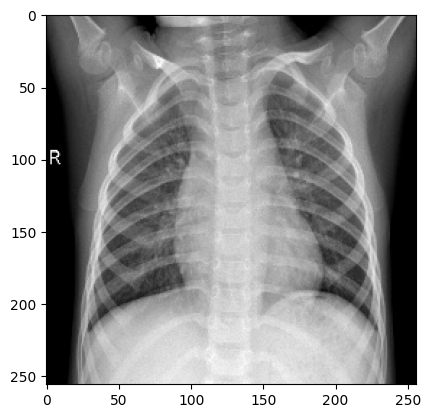

In [ ]:
# Mostramos un elemento
muestra = 7
print('La muesta corresponde a:', dic[ y_train[muestra]  ] )
imagen = array_to_img(x_train[muestra])
imshow(imagen)

# OneHot Encoding:
Realizamos la codificación OneHot para un mayor desempeño del entrenamiento

In [ ]:
# Realizamos codificación
print(y_train[0])
y_train = np.eye(2)[y_train]
print(y_train[0])
y_test = np.eye(2)[y_test]

0
[1. 0.]


In [ ]:
# Observamos codificación
print(y_train.shape)
print(y_test.shape)

(407, 2)
(45, 2)


# TensorBoard - Hiperparametros

In [ ]:
# Uso de Tensor Board
%load_ext tensorboard

# Entrenamiento

In [ ]:
'''
f1 : Filtros de la 1ra Conv2D
f2 : Filtros de la 2da Conv2D
f3 : Filtros de la 3ra Conv2D
ks : Kernel Size -> (10,10)
ps : Pool Size -> (5,5)
h1 : Nodos de la FCC -> 1024

input_shape = Forma de los datos de entrada -> (256, 256, 1)
activation = Funcion de activación -> relu
batch_Normalization: Valor booleano de normalizacion -> True

dropout: Valor booleano de dropout -> True
p_drop: Probabilidad de Dropout -> 0.4
'''

HP_F1 = hp.HParam('f1', hp.Discrete([32])) # 32, 64, 128
HP_F2 = hp.HParam('f2', hp.Discrete([64]))
HP_F3 = hp.HParam('f3', hp.Discrete([32, 64]))

HP_KS = hp.HParam('ks', hp.Discrete([8])) # 4, 8
HP_PS = hp.HParam('ps', hp.Discrete([4])) # 4

HP_H1 = hp.HParam('h1', hp.Discrete([1024])) # 512, 1024, 2056

HP_DROPOUT = hp.HParam('dropout', hp.Discrete([ True ]))
HP_P_DROPOUT = hp.HParam('p_dropout', hp.Discrete([0.001, 0.0 ]))
# 0.4 , 0.1, 0.001

HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['sgd'])) # adam, sgd
HP_LEARNINGRATE= hp.HParam('learning_rate', hp.Discrete([0.1, 0.001]))


METRIC_ACCURACY = 'accuracy'

with tf.summary.create_file_writer('/content/drive/MyDrive/logs/hparam_tuning ').as_default():
  hp.hparams_config(
    hparams=[HP_F1, HP_F2, HP_F3, HP_KS, HP_PS, HP_H1, HP_DROPOUT, HP_P_DROPOUT, HP_OPTIMIZER, HP_LEARNINGRATE ],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

#Modelos

## 1er Modelo
Definimos un modelo de 3 capas convolucionales que permita modificar cada uno de sus parametros

In [ ]:
# Definimos la arquitectura de forma Secuencial
j = '''

PARAMETROS:

f1 : Filtros de la 1ra Conv2D
f2 : Filtros de la 2da Conv2D
f3 : Filtros de la 3ra Conv2D
ks : Kernel Size -> (10,10)
ps : Pool Size -> (5,5)
h1 : Nodos de la FCC -> 1024
input_shape = Forma de los datos de entrada -> (256, 256, 1)
activation = Funcion de activación -> relu
batch_Normalization: Valor booleano de normalizacion -> True
dropout: Valor booleano de dropout -> True
p_drop: Probabilidad de Dropout -> 0.4
'''

def architecture(f1, f2, f3, ks, ps, h1, input_shape, activation, \
                 batch_normalization, dropout, p_drop):

   model = Sequential() # Definimos un modelo secuencial

  # --> 1ra Conv2D
   model.add(Conv2D(filters = f1, kernel_size= (ks,ks),
                   strides=(1,1), padding = 'same',
                   kernel_initializer = 'he_uniform',
                   bias_initializer = 'zeros',
                   input_shape = input_shape,
                   activation = activation
  ))

  # Realizamos MaxPooling
   model.add( MaxPooling2D(pool_size = (ps,ps)) )

   # Bach Normalization:
   if batch_normalization:
    model.add(BatchNormalization())

    # --- > 2da Conv2D
    model.add(Conv2D(filters = f2, kernel_size= (ks,ks),
                   strides=(1,1), padding = 'same',
                   kernel_initializer = 'he_uniform',
                   bias_initializer = 'zeros',
                   activation = activation
  ))

  # Realizamos MaxPooling
   model.add( MaxPooling2D(pool_size = (ps, ps)) )

      # Bach Normalization:
   if batch_normalization:
    model.add(BatchNormalization())


   # ------> 3ra Conv2D
   model.add(Conv2D(filters = f3, kernel_size= (ks, ks),
                   strides=(1,1), padding = 'same',
                   kernel_initializer = 'he_uniform',
                   bias_initializer = 'zeros',
                   activation = activation
  ))

  # Realizamos MaxPooling
   model.add( MaxPooling2D(pool_size = (ps, ps)) )

   # Bach Normalization:
   if batch_normalization:
    model.add(BatchNormalization())


    # ---- > Realizamos Flatten()
    model.add(Flatten())


    # Realizamos FCC:
    model.add(Dense(h1))

    if dropout: # Agregamos Dropout
      model.add(Dropout(p_drop))

    if batch_normalization: # Normalizamos
      model.add(BatchNormalization())

    model.add(Activation(activation)) # Realizamos z(a)

    # --> Capa de salida
    model.add(Dense(2, activation= 'softmax'))

    return model

In [ ]:
from keras.src.backend import batch_normalization
# Colocamos los parametros anteriores en el modelo:

input_shape = (256, 256, 3)
activation = 'relu'
batch_normalization = True

def train_test_model(hparams):
    model_1= architecture(f1 = hparams[HP_F1] ,
                          f2 = hparams[HP_F2],
                          f3 = hparams[HP_F3],
                          ks = hparams[HP_KS],
                          ps= hparams[HP_PS],
                          h1 = hparams[HP_H1],
                          input_shape = input_shape,
                          activation = activation,
                          batch_normalization= batch_normalization,
                          dropout= hparams[HP_DROPOUT],
                          p_drop= hparams[HP_P_DROPOUT])
    model_1.compile(
          optimizer=hparams[HP_OPTIMIZER],
          loss='categorical_crossentropy',
          metrics=['accuracy']
      )
    model_1.optimizer.learning_rate=hparams[HP_LEARNINGRATE]
    model_1.fit(x = x_train, y = y_train, epochs = 5, batch_size = 32, \
                                validation_split = 0.1, shuffle=True, verbose=0) # Run with 1 epoch to speed things up for demo purposes
    _, accuracy = model_1.evaluate(x = x_test, y = y_test)
    K.clear_session()
    return accuracy



In [ ]:
# Almacenamos los resultados en Tensorboard
def training(run_dir, hparams):
    with tf.summary.create_file_writer(run_dir).as_default():
        hp.hparams(hparams)  # record the values used in this trial
        accuracy = train_test_model(hparams)
        tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)

In [ ]:
# Realizamos el entrenamiento de HiperParametros:
from collections import OrderedDict, namedtuple
from itertools import product
session_num = 0

class RunBuilder():
    @staticmethod
    def get_runs(params):
        Run=namedtuple('Run', params.keys())

        runs=[]

        for v in product(*params.values()):
            runs.append(Run(*v))

        return runs

params=OrderedDict(
        f1_r = [ f1_t for f1_t in HP_F1.domain.values ],
        f2_r = [ f2_t for f2_t in HP_F2.domain.values ],
        f3_r = [ f3_t for f3_t in HP_F3.domain.values ],

        ks_r = [ ks_t for ks_t in HP_KS.domain.values],
        ps_r = [ ps_t for ps_t in HP_PS.domain.values],

        h1_r = [ h1_t for h1_t in HP_H1.domain.values],

        dropout_r = [dropout_t for dropout_t in HP_DROPOUT.domain.values],
        p_dropout_r = [p_dropout_t for p_dropout_t in HP_P_DROPOUT.domain.values],

        optim=[optimizer for optimizer in HP_OPTIMIZER.domain.values],
        lr=[lr for lr in HP_LEARNINGRATE.domain.values],

    )

for run in RunBuilder().get_runs(params):
    hparams = {
          HP_F1 : run.f1_r,
          HP_F2 : run.f2_r,
          HP_F3 : run.f3_r,
          HP_KS : run.ks_r,
          HP_PS : run.ps_r,
          HP_H1 : run.h1_r,
          HP_DROPOUT : run.dropout_r,
          HP_P_DROPOUT : run.p_dropout_r,
          HP_OPTIMIZER: run.optim,
          HP_LEARNINGRATE: run.lr,
      }
    run_name = "run-%d" % session_num
    print('--- Iniciando Entrenamiento: %s' % run_name)
    print({h.name: hparams[h] for h in hparams})
    training('/content/drive/MyDrive/logs/hparam_tuning/' + run_name, hparams)
    session_num += 1


--- Iniciando Entrenamiento: run-0
{'f1': 32, 'f2': 64, 'f3': 32, 'ks': 8, 'ps': 4, 'h1': 1024, 'dropout': True, 'p_dropout': 0.0, 'optimizer': 'sgd', 'learning_rate': 0.001}
2/2 [==============================] - 0s 419ms/step - loss: 0.6363 - accuracy: 0.5111
--- Iniciando Entrenamiento: run-1
{'f1': 32, 'f2': 64, 'f3': 32, 'ks': 8, 'ps': 4, 'h1': 1024, 'dropout': True, 'p_dropout': 0.0, 'optimizer': 'sgd', 'learning_rate': 0.1}
2/2 [==============================] - 0s 18ms/step - loss: 5.0280 - accuracy: 0.4889
--- Iniciando Entrenamiento: run-2
{'f1': 32, 'f2': 64, 'f3': 32, 'ks': 8, 'ps': 4, 'h1': 1024, 'dropout': True, 'p_dropout': 0.001, 'optimizer': 'sgd', 'learning_rate': 0.001}
2/2 [==============================] - 0s 20ms/step - loss: 0.6737 - accuracy: 0.4889
--- Iniciando Entrenamiento: run-3
{'f1': 32, 'f2': 64, 'f3': 32, 'ks': 8, 'ps': 4, 'h1': 1024, 'dropout': True, 'p_dropout': 0.001, 'optimizer': 'sgd', 'learning_rate': 0.1}
2/2 [==============================] - 0s

In [ ]:
# Visualizamos los datos en TensorBoard
%tensorboard --logdir /content/drive/MyDrive/logs/hparam_tuning/ --host localhost


Output hidden; open in https://colab.research.google.com to view.

Como puede apreciarse en el diagrama anterior, el acurracy más alto se alcanza con:

f1= 32, f2 = 64, f3 = 64

ks = 8, ps = 4

dropout = True
p_dropout = 0.001

SGD a 0.1

Nodos: 1024

De manera que entramos el módelo completo con tales parametros.

# Entrenamiento Completo

Consideramos los siguientes parametros:

f1= 32, f2 = 64, f3 = 64

ks = 8, ps = 4

dropout = True
p_dropout = 0.001

SGD a 0.1

Nodos: 1024


In [ ]:
# Importamos las librerias a usar:
import pandas as pd
import numpy as np
import sys

import tensorflow as tf
from tensorflow import keras

from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Dense, Activation, Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from keras.preprocessing.image import array_to_img
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from sklearn.preprocessing import OneHotEncoder
import pydot
from IPython.display import SVG
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import SGD

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization

from tensorboard.plugins.hparams import api as hp

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import pickle

from keras import backend as K

import time

np.random.seed(1)

%matplotlib inline

In [ ]:
# Utilizar GPU
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print("physical_devices-------------", len(physical_devices))
tf.config.experimental.set_memory_growth(physical_devices[0], True)

physical_devices------------- 1


In [ ]:
# Cargamos los datos
x_train = np.load('/content/drive/MyDrive/Variables/train_x.npy')
y_train = np.load('/content/drive/MyDrive/Variables/train_y.npy')

x_test = np.load('/content/drive/MyDrive/Variables/test_x.npy')
y_test = np.load('/content/drive/MyDrive/Variables/test_y.npy')

In [ ]:
# Entrenamos con 1/4 de los datos
n = '''
n = 1
x_train = x_train[ : (x_train.shape[0])//n ]
y_train = y_train[ : (y_train.shape[0])//n ]
x_test  = x_test[ : (x_test.shape[0])//n ]
y_test  = y_test[ : (y_test.shape[0])//n ]
'''

# Normalizamos los valores tomando la cantidad de pixeles = 255.
x_train = x_train/255.0
x_test = x_test/255.0

# Codificamos los datos
y_train = np.eye(2)[y_train]
y_test = np.eye(2)[y_test]

# Visualizamos la forma de los datos:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)


(2849, 256, 256, 3)
(2849, 2)
(317, 256, 256, 3)
(317, 2)


In [ ]:
# Redifinimos la arquitectura
def architecture(input_shape):

   model = Sequential() # Definimos un modelo secuencial

  # --> Variables
   ks = 8 ; ps = 4
   activation = 'relu'
   batch_normalization = True
   dropout = True
   p_drop = 0.001

   # --> 1ra Conv2D
   model.add(Conv2D(filters = 32, kernel_size= (ks,ks),
                   strides=(1,1), padding = 'same',
                   kernel_initializer = 'he_uniform',
                   bias_initializer = 'zeros',
                   input_shape = input_shape,
                   activation = activation
  ))

  # Realizamos MaxPooling
   model.add( MaxPooling2D(pool_size = (ps,ps)) )

   # Bach Normalization:
   if batch_normalization:
    model.add(BatchNormalization())

    # --- > 2da Conv2D
    model.add(Conv2D(filters = 64, kernel_size= (ks,ks),
                   strides=(1,1), padding = 'same',
                   kernel_initializer = 'he_uniform',
                   bias_initializer = 'zeros',
                   activation = activation
  ))

  # Realizamos MaxPooling
   model.add( MaxPooling2D(pool_size = (ps, ps)) )

      # Bach Normalization:
   if batch_normalization:
    model.add(BatchNormalization())


   # ------> 3ra Conv2D
   model.add(Conv2D(filters = 64, kernel_size= (ks, ks),
                   strides=(1,1), padding = 'same',
                   kernel_initializer = 'he_uniform',
                   bias_initializer = 'zeros',
                   activation = activation
  ))

  # Realizamos MaxPooling
   model.add( MaxPooling2D(pool_size = (ps, ps)) )

   # Bach Normalization:
   if batch_normalization:
    model.add(BatchNormalization())


    # ---- > Realizamos Flatten()
    model.add(Flatten())


    # Realizamos FCC:
    model.add(Dense(1024))

    if dropout: # Agregamos Dropout
      model.add(Dropout(p_drop))

    if batch_normalization: # Normalizamos
      model.add(BatchNormalization())

    model.add(Activation(activation)) # Realizamos z(a)

    # --> Capa de salida
    model.add(Dense(2, activation= 'softmax'))

    # Creamos la instancia

    return model

In [ ]:
# Declaramos el modelo
best_model = architecture((256,256,3))

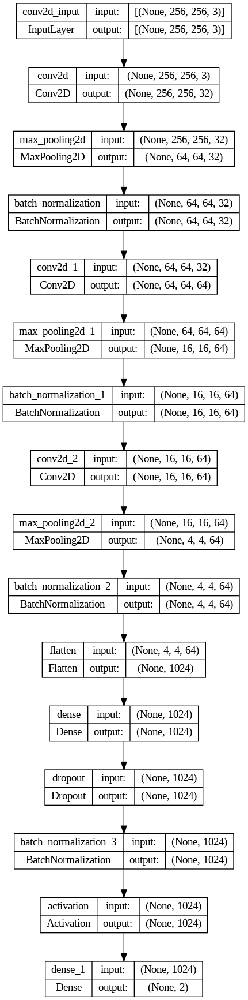

In [ ]:
# Mostramos la arquitectura:
plot_model(best_model, to_file='/content/drive/MyDrive/best_model.png', show_shapes=True, show_layer_names=True)

In [ ]:
# Mostramos la cantidad de parametros:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 32)      6176      
                                                                 
 max_pooling2d (MaxPooling2  (None, 64, 64, 32)        0         
 D)                                                              
                                                                 
 batch_normalization (Batch  (None, 64, 64, 32)        128       
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        131136    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 16, 16, 64)        0         
 g2D)                                                            
                                                        

In [ ]:
# Declaramos el optimizador
learning_rate = 0.1
optimizer = keras.optimizers.SGD(learning_rate = learning_rate)

In [ ]:
# Declaramos funcion de perdida y métrica:
loss_function = 'categorical_crossentropy' # Puede usarse dada la codificación OneHot Encoding
metric_function = 'accuracy'

In [ ]:
# Compilamos el modelo
best_model.compile(optimizer = optimizer, loss = loss_function, metrics = [metric_function])

In [ ]:
# Realizamos el entrenamiento a 30 épocas:

#10 % of the training data will be used to validate the training
start_time = time.time()

validation_portion = 0.1
batch_size= 32
num_epochs = 30 # Modificamos la cantidad de épocas a 30

tensorboard_callback = keras.callbacks.TensorBoard(
    log_dir="/content/drive/MyDrive/logs/best_model", histogram_freq=1)

history = best_model.fit(x= x_train, y= y_train, epochs=num_epochs, batch_size=batch_size, \
                            validation_split=validation_portion, shuffle=True,
                            callbacks=[tensorboard_callback], verbose=1)

end_time = time.time()
print("Time for training: {:10.4f}s".format(end_time - start_time))

Epoch 1/30
81/81 [==============================] - 23s 99ms/step - loss: 0.4113 - accuracy: 0.8888 - val_loss: 0.2954 - val_accuracy: 0.8877
Epoch 2/30
81/81 [==============================] - 5s 68ms/step - loss: 0.2526 - accuracy: 0.9278 - val_loss: 0.1491 - val_accuracy: 0.9439
Epoch 3/30
81/81 [==============================] - 6s 71ms/step - loss: 0.1297 - accuracy: 0.9598 - val_loss: 10.3165 - val_accuracy: 0.4737
Epoch 4/30
81/81 [==============================] - 6s 76ms/step - loss: 0.2460 - accuracy: 0.9473 - val_loss: 0.1755 - val_accuracy: 0.9298
Epoch 5/30
81/81 [==============================] - 6s 72ms/step - loss: 0.0831 - accuracy: 0.9723 - val_loss: 0.1178 - val_accuracy: 0.9649
Epoch 6/30
81/81 [==============================] - 6s 73ms/step - loss: 0.0638 - accuracy: 0.9785 - val_loss: 0.1643 - val_accuracy: 0.9298
Epoch 7/30
81/81 [==============================] - 6s 71ms/step - loss: 0.0420 - accuracy: 0.9867 - val_loss: 0.9899 - val_accuracy: 0.6912
Epoch 8/30


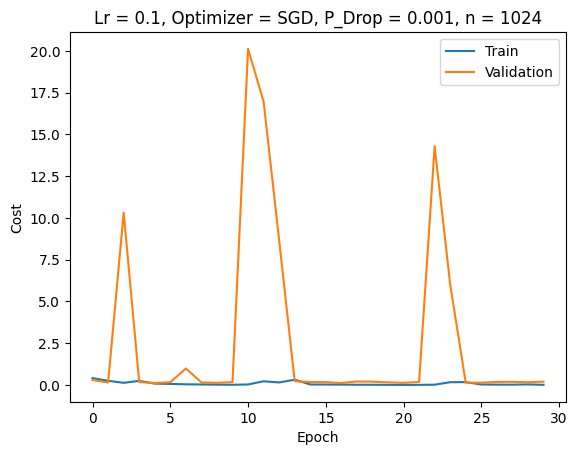

In [ ]:
# Visualizamos la información en gráficas:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Lr = 0.1, Optimizer = SGD, P_Drop = 0.001, n = 1024')
plt.ylabel('Cost')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

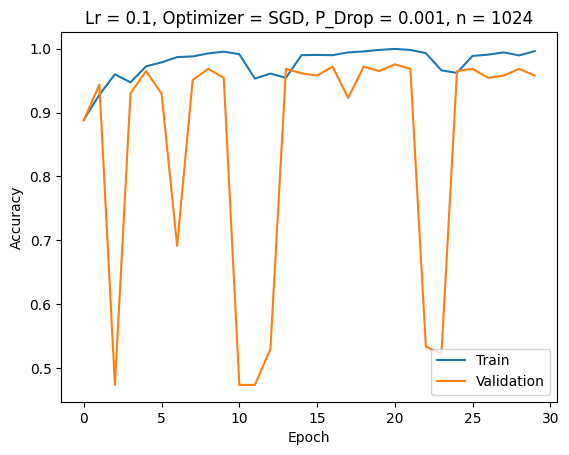

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Lr = 0.1, Optimizer = SGD, P_Drop = 0.001, n = 1024')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

In [ ]:
# Evaluamos el modelo
evaluations = best_model.evaluate(x = x_test, y = y_test)

print ("Loss = " + str(evaluations[0]))
print ("Test Accuracy = " + str(evaluations[1]))

10/10 [==============================] - 0s 27ms/step - loss: 0.1980 - accuracy: 0.9464
Loss = 0.19803978502750397
Test Accuracy = 0.9463722109794617


In [ ]:
# Guardamos el modelo
best_model.save('/content/drive/MyDrive/Best_Model.keras')

In [ ]:
best_model.save('/content/drive/MyDrive/Best_Model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# Implementación de Arquitectura U-Net  

U-Net es un modelo de arquitectura propuesta en 2015 cuya finalidad es la segmentación de imagenes en el ámbito método.

La segmentación de imagenes consiste en la extracción de determinados carácteres presentes en imagenes.

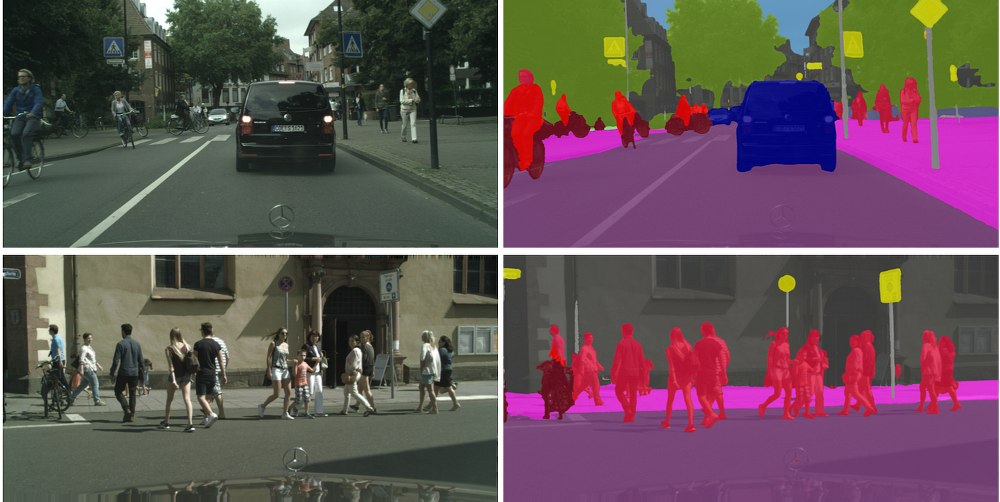

En esta ocasión utilizaremos la arquitectura siguiente como un pre-entrenamiento para nuestra red, de manera que nuestros datos ingresen a la U-Net, y mediante la segmentación de datos se preparen datos de mayor alcance, estos datos ingresarán a la arquitectura anteriormente definida

Arquitectura a diseñar:

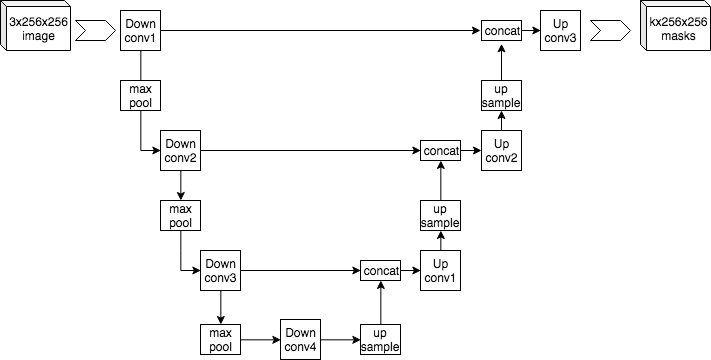

In [ ]:
# Importamos las librerias a usar
import pandas as pd
import numpy as np
import sys

import tensorflow as tf
from tensorflow import keras

from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Dense, Activation, Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from keras.preprocessing.image import array_to_img
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from sklearn.preprocessing import OneHotEncoder
import pydot
from IPython.display import SVG
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import SGD

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate


from tensorboard.plugins.hparams import api as hp

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import pickle

from keras import backend as K

import time

np.random.seed(1)

%matplotlib inline


In [ ]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print("physical_devices-------------", len(physical_devices))
tf.config.experimental.set_memory_growth(physical_devices[0], True)

physical_devices------------- 1


In [ ]:
# Importamos los datos a usar
x_train = np.load('/content/drive/MyDrive/Variables/train_x.npy')
y_train = np.load('/content/drive/MyDrive/Variables/train_y.npy')

x_test = np.load('/content/drive/MyDrive/Variables/test_x.npy')
y_test = np.load('/content/drive/MyDrive/Variables/test_y.npy')

In [ ]:
# Utilizamos una parte de los datos para la creacion
n = 4
x_train = x_train[ : (x_train.shape[0])//n ]
y_train = y_train[ : (y_train.shape[0])//n ]
x_test  = x_test[ : (x_test.shape[0])//n ]
y_test  = y_test[ : (y_test.shape[0])//n ]

In [ ]:
# Verificamos el tipo de dato
print('Cantidad de datos \t Tipo de formato')
print(x_train.shape, '\t',  type(x_train))
print(y_train.shape,'\t \t', type(y_train))

print(x_test.shape,'\t', type(x_test))
print(y_test.shape,'\t \t', type(y_test))

Cantidad de datos 	 Tipo de formato
(712, 256, 256, 3) 	 <class 'numpy.ndarray'>
(712,) 	 	 <class 'numpy.ndarray'>
(79, 256, 256, 3) 	 <class 'numpy.ndarray'>
(79,) 	 	 <class 'numpy.ndarray'>


In [ ]:
# Normalizamos los valores tomando la cantidad de pixeles = 255.
x_train = x_train/255.0
x_test = x_test/255.0

In [ ]:
# Realizamos la codificacion
y_train = np.eye(2)[y_train]
y_test = np.eye(2)[y_test]

In [ ]:
# Importamos TensorBoard
%load_ext tensorboard

In [ ]:
# Declaramos la arquitectura de nuestro modelo

def U_Net(input_size = (256, 256, 3) ):

  inputs = Input(input_size) # Declaramos la entrada

  # --------------------- INICIO U-NET -----------------------

  # -> Encoder
  # Primer bloque: Consiste en dos capas convolucionales----
  conv1 = Conv2D(filters = 64,
                 kernel_size = 3,
                 padding = 'same')(inputs)
  # Normalizamos despues de Conv2D y antes de Activation
  conv1 = BatchNormalization()(conv1)
  conv1 = Activation('relu')(conv1)

  conv1 = Conv2D(filters = 64,
                 kernel_size = 3,
                 padding = 'same')(conv1)
  conv1 = BatchNormalization()(conv1)
  conv1 = Activation('relu')(conv1)

  pool1 = MaxPooling2D(pool_size=(2,2))(conv1)

  # Segundo bloque -----------------------------------
  conv2 = Conv2D(filters = 128,
                 kernel_size=  3,
                 padding = 'same')(pool1)

  conv2 = BatchNormalization()(conv2)
  conv2 = Activation('relu')(conv2)

  conv2 = Conv2D(filters = 128,
                 kernel_size=  3,
                 padding = 'same')(conv2)

  conv2 = BatchNormalization()(conv2)
  conv2 = Activation('relu')(conv2)

  pool2 = MaxPooling2D(pool_size = (2,2))(conv2)

  # Tercer Bloque -----------------------------------
  conv3 = Conv2D(filters = 256,
                 kernel_size = 3,
                 padding = 'same'
                 )(pool2)

  conv3 = BatchNormalization()(conv3)
  conv3 = Activation('relu')(conv3)

  conv3 = Conv2D(filters = 256,
                 kernel_size = 3,
                 padding = 'same')(conv3)

  conv3 = BatchNormalization()(conv3)
  conv3 = Activation('relu')(conv3)

  pool3 = MaxPooling2D(pool_size = (2,2))(conv3)

  # Intermedio:
  conv4 = Conv2D(filters = 512,
                 kernel_size = 3,
                 padding='same')(pool3)

  conv4 = BatchNormalization()(conv4)
  conv4 = Activation('relu')(conv4)

  conv4 = Conv2D(filters = 512,
                 kernel_size = 3,
                 padding='same')(conv4)

  conv4 = BatchNormalization()(conv4)
  conv4 = Activation('relu')(conv4)

  # Decoder
  # Se realiza UpSample junto con Concat para UpConv1
  up5 = Concatenate()( [UpSampling2D(size=(2, 2))(conv4), conv3] )

  # ----------
  conv5 = Conv2D(256, 3, padding='same')(up5)
  conv5 = BatchNormalization()(conv5)
  conv5 = Activation('relu')(conv5)

  conv5 = Conv2D(256, 3, padding='same')(conv5)
  conv5 = BatchNormalization()(conv5)
  conv5 = Activation('relu')(conv5)
  # ---------

  up6 = Concatenate()([UpSampling2D(size=(2, 2))(conv5), conv2])

  conv6 = Conv2D(128, 3, padding='same')(up6)
  conv6 = BatchNormalization()(conv6)
  conv6 = Activation('relu')(conv6)

  conv6 = Conv2D(128, 3, padding='same')(conv6)
  conv6 = BatchNormalization()(conv6)
  conv6 = Activation('relu')(conv6)

  up7 = Concatenate()([UpSampling2D(size=(2, 2))(conv6), conv1])

  conv7 = Conv2D(64, 3, padding='same')(up7)
  conv7 = BatchNormalization()(conv7)
  conv7 = Activation('relu')(conv7)

  conv7 = Conv2D(64, 3, padding='same')(conv7)
  conv7 = BatchNormalization()(conv7)
  conv7 = Activation('relu')(conv7)

  # Declaramos la salida:
  outputs = Conv2D(filters = 1,
                   kernel_size = 1,
                   activation = 'sigmoid')(conv7)

  # --------------------- FIN U-NET ----------------------

  # Ingresa a la arquitectura inicial

  convI_1 = Conv2D(filters = 32, kernel_size = 8,
                   strides = 1, padding= 'same',
                   kernel_initializer = 'he_uniform',
                   bias_initializer = 'zeros')(outputs)

  # Procesos BN-Pool
  convI_1 = BatchNormalization()(convI_1)
  convI_1 = Activation('relu')(convI_1)
  poolI_1 = MaxPooling2D(pool_size = 4)(convI_1)


  convI_2 = Conv2D(filters = 64, kernel_size = 8,
                  strides = 1, padding = 'same',
                  kernel_initializer = 'he_uniform',
                  bias_initializer = 'zeros')(poolI_1)

  # Proceso BN-Pool
  convI_2 = BatchNormalization()(convI_2)
  convI_2 = Activation('relu')(convI_2)
  poolI_2 = MaxPooling2D(pool_size = 4)(convI_2)


  convI_3 = Conv2D(filters = 64, kernel_size = 8,
                   strides = 1, padding = 'same',
                   kernel_initializer = 'he_uniform',
                   bias_initializer = 'zeros')(poolI_2)

  # Proceso BN-Pool
  convI_3 = BatchNormalization()(convI_3)
  convI_3 = Activation('relu')(convI_3)
  poolI_3 = MaxPooling2D(pool_size = 4)(convI_3)


  # Realizamos Flatten()
  flat = Flatten()(poolI_3)

  # Realizamos la FC
  FC = Dense(1024)(flat)
  FC = Dropout(0.001)(FC)
  FC = BatchNormalization()(FC)
  FC = Activation('relu')(FC)

  # Declaramos la cada de salida
  outputs_f = Dense(2, activation = 'softmax')(FC)
  model = Model(inputs = inputs, outputs = outputs_f)

  return model

In [ ]:
# Compilamos nuestro modelo
modelo_U_Net = U_Net()

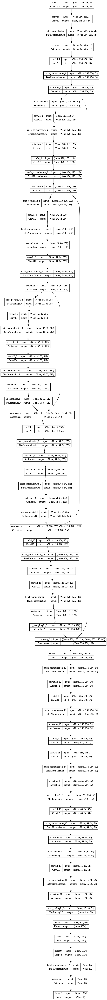

In [ ]:
plot_model(modelo_U_Net, to_file='/content/drive/MyDrive/modelo_U_Net.png', show_shapes=True, show_layer_names=True)

In [ ]:
modelo_U_Net.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 256, 256, 64)         256       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 256, 256, 64)         0         ['batch_normalization[0][0

In [ ]:
learning_rate = 0.1
optimizer = keras.optimizers.SGD(learning_rate = learning_rate)

In [ ]:
# Declaramos funcion de perdida y métrica:
loss_function = 'categorical_crossentropy' # Puede usarse dada la codificación OneHot Encoding
metric_function = 'accuracy'

In [ ]:
modelo_U_Net.compile(optimizer = optimizer, loss = loss_function, metrics = [metric_function])

In [ ]:
# Realizamos el entrenamiento a 30 épocas:

#10 % of the training data will be used to validate the training
start_time = time.time()

validation_portion = 0.1
batch_size= 32
num_epochs = 30 # Modificamos la cantidad de épocas a 30

tensorboard_callback = keras.callbacks.TensorBoard(
    log_dir="/content/drive/MyDrive/logs/modelo_U_Net", histogram_freq=1)

history = modelo_U_Net.fit(x= x_train, y= y_train, epochs=num_epochs, batch_size=batch_size, \
                            validation_split=validation_portion, shuffle=True,
                            callbacks=[tensorboard_callback], verbose=1)

end_time = time.time()
print("Time for training: {:10.4f}s".format(end_time - start_time))

Epoch 1/30
20/20 [==============================] - 83s 2s/step - loss: 0.5586 - accuracy: 0.8313 - val_loss: 0.9054 - val_accuracy: 0.5000
Epoch 2/30
20/20 [==============================] - 37s 2s/step - loss: 0.2934 - accuracy: 0.9031 - val_loss: 2.7522 - val_accuracy: 0.4861
Epoch 3/30
20/20 [==============================] - 37s 2s/step - loss: 0.1711 - accuracy: 0.9422 - val_loss: 0.9542 - val_accuracy: 0.6111
Epoch 4/30
20/20 [==============================] - 37s 2s/step - loss: 0.0668 - accuracy: 0.9781 - val_loss: 0.3735 - val_accuracy: 0.8472
Epoch 5/30
20/20 [==============================] - 36s 2s/step - loss: 0.0381 - accuracy: 0.9891 - val_loss: 0.6043 - val_accuracy: 0.8333
Epoch 6/30
20/20 [==============================] - 36s 2s/step - loss: 0.0228 - accuracy: 0.9906 - val_loss: 0.6309 - val_accuracy: 0.7778
Epoch 7/30
20/20 [==============================] - 37s 2s/step - loss: 0.0291 - accuracy: 0.9891 - val_loss: 2.1802 - val_accuracy: 0.5278
Epoch 8/30
20/20 [==

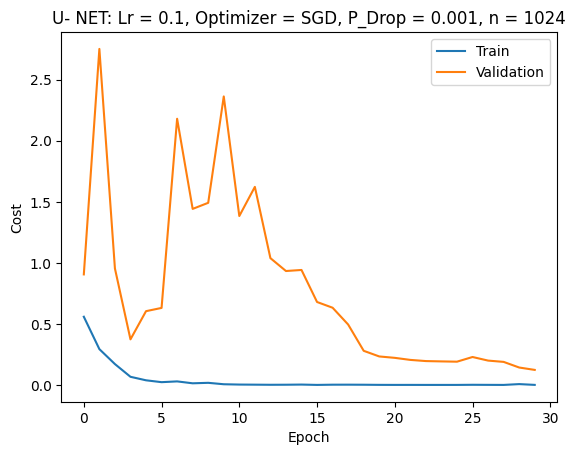

In [ ]:
# Visualizamos la información en gráficas:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('U- NET: Lr = 0.1, Optimizer = SGD, P_Drop = 0.001, n = 1024')
plt.ylabel('Cost')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

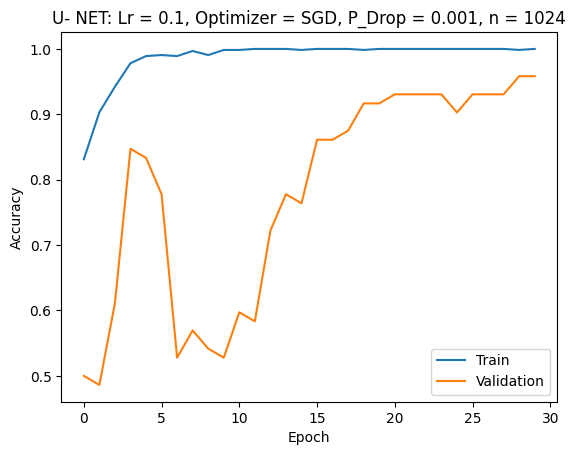

In [ ]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('U- NET: Lr = 0.1, Optimizer = SGD, P_Drop = 0.001, n = 1024')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

In [ ]:
# Evaluamos el modelo
evaluations = modelo_U_Net.evaluate(x = x_test, y = y_test)

print ("U-Net -> Loss = " + str(evaluations[0]))
print ("U-Net -> Test Accuracy = " + str(evaluations[1]))

3/3 [==============================] - 6s 3s/step - loss: 0.1876 - accuracy: 0.9620
U-Net -> Loss = 0.18761585652828217
U-Net -> Test Accuracy = 0.9620253443717957


In [ ]:
# Guardamos el modelo
modelo_U_Net.save('/content/drive/MyDrive/modelo_U_Net.keras')

In [ ]:
modelo_U_Net.save('/content/drive/MyDrive/modelo_U_Net.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# UpSampling2D()

La función UpSampling2D en Keras se utiliza para realizar un aumento en la dimensión espacial de los datos. Es comúnmente utilizada en arquitecturas de redes neuronales para tareas de segmentación de imágenes, como en la U-Net, donde se necesita realizar una "decodificación" o expansión de la resolución espacial.

La idea principal detrás de UpSampling2D es aumentar el tamaño de la entrada replicando los datos en las dimensiones especificadas. En el contexto de una arquitectura U-Net o arquitecturas similares, se utiliza para "des-hacer" las operaciones de reducción de tamaño (downsampling) que se realizan en las capas anteriores de la red.

La forma más común de UpSampling2D es duplicar cada fila y columna, lo que efectivamente duplica la resolución espacial de los datos. Se puede controlar el tamaño del aumento especificando el parámetro size, que es una tupla de dos enteros que representa el factor de aumento para cada dimensión.

# Concatenate()

La función Concatenate en Keras se utiliza para concatenar (unir) capas a lo largo de un eje específico. Es especialmente útil cuando estás diseñando arquitecturas de redes neuronales que tienen ramificaciones o conexiones residuales, donde necesitas combinar la información de varias capas.

La función Concatenate toma como entrada una lista de tensores y los concatena a lo largo de un eje específico

# Probamos el modelo

In [ ]:
# Importamos las librerias a usar:
import pandas as pd
import numpy as np
import sys

import tensorflow as tf
from tensorflow import keras

from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Dense, Activation, Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from keras.preprocessing.image import array_to_img
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from sklearn.preprocessing import OneHotEncoder
import pydot
from IPython.display import SVG
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import SGD

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import BatchNormalization

from tensorboard.plugins.hparams import api as hp

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import pickle

from keras import backend as K
from keras.models import load_model

import time

np.random.seed(1)

%matplotlib inline

In [ ]:
# Importamos los datos
x_train = np.load('/content/drive/MyDrive/Variables/train_x.npy')
y_train = np.load('/content/drive/MyDrive/Variables/train_y.npy')

x_test = np.load('/content/drive/MyDrive/Variables/test_x.npy')
y_test = np.load('/content/drive/MyDrive/Variables/test_y.npy')

In [ ]:
# Verificamos el tipo de dato
print('Cantidad de datos \t Tipo de formato')
print(x_train.shape, '\t',  type(x_train))
print(y_train.shape,'\t \t', type(y_train))

print(x_test.shape,'\t', type(x_test))
print(y_test.shape,'\t \t', type(y_test))

Cantidad de datos 	 Tipo de formato
(2849, 256, 256, 3) 	 <class 'numpy.ndarray'>
(2849,) 	 	 <class 'numpy.ndarray'>
(317, 256, 256, 3) 	 <class 'numpy.ndarray'>
(317,) 	 	 <class 'numpy.ndarray'>


In [ ]:
# Normalizamos los valores tomando la cantidad de pixeles = 255.
x_train = x_train/255.0
x_test = x_test/255.0

# Realizamos codificación OneHot
y_train = np.eye(2)[y_train]
y_test = np.eye(2)[y_test]

In [ ]:
# Cargamos el modelo
modelo_U_Net_test = load_model('/content/drive/MyDrive/modelo_U_Net.keras')

In [ ]:
# Probamos el modelo con todos los datos
evaluations = modelo_U_Net_test.evaluate(x = x_test, y=y_test)

print('Evaluación completa: \n')
print ("U-Net -> Loss = " + str(evaluations[0]))
print ("U-Net -> Test Accuracy = " + str(evaluations[1]))

10/10 [==============================] - 35s 1s/step - loss: 0.3323 - accuracy: 0.9274
Evaluación completa: 

U-Net -> Loss = 0.33229345083236694
U-Net -> Test Accuracy = 0.9274448156356812
